In [1]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.optimizers import Adam

(x_train, y_train), (x_test, y_test) = datasets.cifar10.load_data()

# нормалізація даних
x_train, x_test = x_train / 255.0, x_test / 255.0

y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

# архітектура нейромережі
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

# компіляція моделі
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# навчання моделі
history = model.fit(x_train, y_train, epochs=20,
                    validation_data=(x_test, y_test),
                    batch_size=64)

# оцінка точності моделі
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"Точність спрощеної згорткової НМ: {test_acc:.4f}")


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 120s 150ms/step - accuracy: 0.2654 - loss: 2.0277 - val_accuracy: 0.4340 - val_loss: 1.5947
Epoch 2/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 118s 151ms/step - accuracy: 0.4483 - loss: 1.5274 - val_accuracy: 0.4902 - val_loss: 1.4172
Epoch 3/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 142s 151ms/step - accuracy: 0.4986 - loss: 1.3977 - val_accuracy: 0.5241 - val_loss: 1.3297
Epoch 4/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 149s 160ms/step - accuracy: 0.5350 - loss: 1.3094 - val_accuracy: 0.5427 - val_loss: 1.2707
Epoch 5/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 122s 156ms/step - accuracy: 0.5598 - loss: 1.2556 - val_accuracy: 0.5700 - val_loss: 1.2218
Epoch 6/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 119s 152ms/step - accuracy: 0.5798 - loss: 1.2000 - val_accuracy: 0.5837 - val_loss: 1.1836
Epoch 7/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 140s 150ms/step - accuracy: 0.5945 - loss: 1.1533 - val_accuracy: 0.5958 - val_loss: 1.1432
Epoch 8/20
782/782 ━━━━━━━━━━━━━━━━━━━━ 141s 148ms/step - accuracy: 0.6098 -

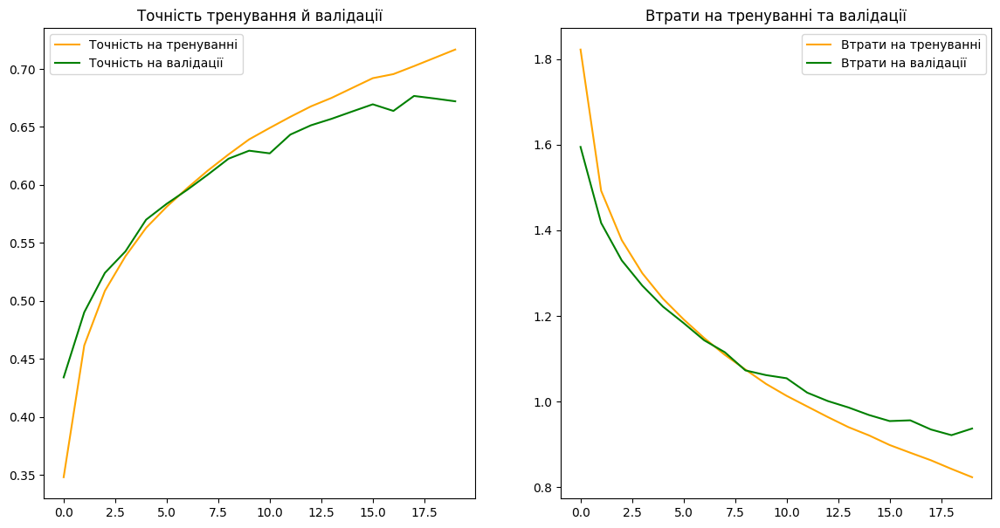

In [2]:
# import matplotlib.pyplot as plt

# # створення графіків точності та втрат
# def plot_accuracy_loss(history):
#     acc = history.history['accuracy']
#     val_acc = history.history['val_accuracy']
#     loss = history.history['loss']
#     val_loss = history.history['val_loss']

#     epochs = range(len(acc))

#     plt.figure(figsize=(14, 5))

#     plt.subplot(1, 2, 1)
#     plt.plot(epochs, acc, 'b', label='Training accuracy')
#     plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
#     plt.title('Training and validation accuracy')
#     plt.legend()

#     plt.subplot(1, 2, 2)
#     plt.plot(epochs, loss, 'b', label='Training loss')
#     plt.plot(epochs, val_loss, 'r', label='Validation loss')
#     plt.title('Training and validation loss')
#     plt.legend()

#     plt.show()

# plot_accuracy_loss(history)


import matplotlib.pyplot as plt

# створення графіків точності й втрат
def plot_accuracy_loss(history, test_loss, test_acc):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.figure(figsize=(14, 7))

    # графік точності
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'orange', label='Точність на тренуванні')
    plt.plot(epochs, val_acc, 'green', label='Точність на валідації')
    plt.title('Точність тренування й валідації')
    plt.legend()

    # графік втрат
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'orange', label='Втрати на тренуванні')
    plt.plot(epochs, val_loss, 'green', label='Втрати на валідації')
    plt.title('Втрати на тренуванні та валідації')
    plt.legend()

    plt.show()

# відображення результатів
plot_accuracy_loss(history, test_loss, test_acc)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


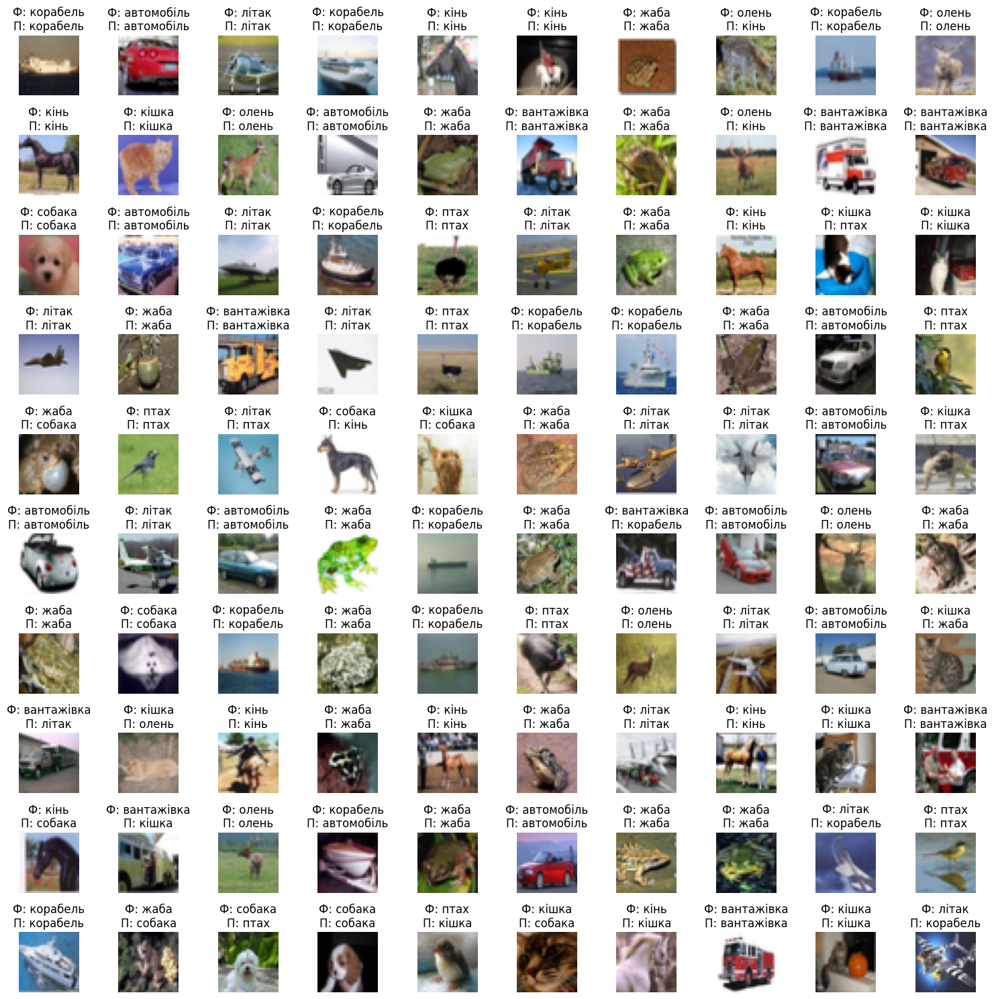

Точність на вибіркових зображеннях: 78.0 %


In [3]:
import matplotlib.pyplot as plt
import numpy as np

# назв класів cifar10
class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

# вибір 100 випадкових зображень із тестової вибірки у cifar10
indices = np.random.choice(len(x_test), 100, replace=False)
sample_images = x_test[indices]
sample_labels = np.argmax(y_test[indices], axis=1)

# Прогнозування міток для цих зображень за допомогою моделі
predictions = model.predict(sample_images)
predicted_labels = np.argmax(predictions, axis=1)

# Виведення зображень та передбачень
fig, axes = plt.subplots(10, 10, figsize=(15, 15))
axes = axes.flatten()

for i, (image, true_label, predicted_label) in enumerate(zip(sample_images, sample_labels, predicted_labels)):
    axes[i].imshow(image)
    true_class = class_labels[true_label]
    predicted_class = class_labels[predicted_label]
    axes[i].set_title(f"Ф: {true_class}\nП: {predicted_class}") # П-прогнозування, Ф-фактичне на картинці
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# розрахунок точності прогнозу на отриманних  зображеннях
correct_predictions = np.sum(predicted_labels == sample_labels)
total_predictions = len(sample_labels)
accuracy_on_sample = correct_predictions / total_predictions

# виведення точності прогнозу на зразках
print(f"Точність на вибіркових зображеннях: {accuracy_on_sample * 100:.1f} %")



In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
model.save('/content/drive/MyDrive/cnn_model1_r1.keras')


In [7]:
from tensorflow.keras.models import load_model

model = load_model('/content/drive/MyDrive/cnn_model1_r1.keras')


In [8]:
from google.colab import files
files.download('/content/drive/MyDrive/cnn_model1_r1.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Опрацювання зображення

Saving airplane3.jpg to airplane3 (1).jpg
Saving airplane9.jpg to airplane9.jpg
Saving car4.jpg to car4 (1).jpg
Saving car6.jpg to car6 (1).jpg
Saving cat2.jpg to cat2.jpg
Saving cat3.jpg to cat3.jpg
Saving cat6.jpg to cat6.jpg
Saving deer2.jpg to deer2.jpg
Saving dog2.jpg to dog2.jpg
Saving frog5.jpg to frog5.jpg
Saving horse1.jpg to horse1.jpg
Saving horse4.jpg to horse4.jpg


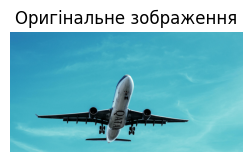

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
Низька впевненість (47.43%). Застосування альтернативних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


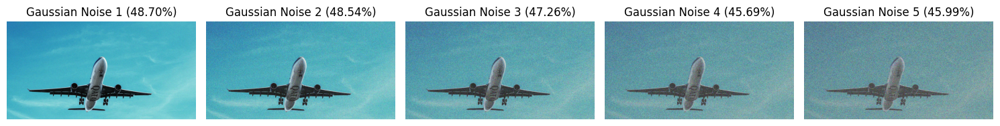

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Зображення не підходить для класифікації навіть після детальної обробки.


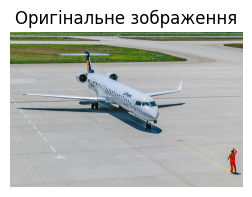

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Впевненість середня (70.03%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


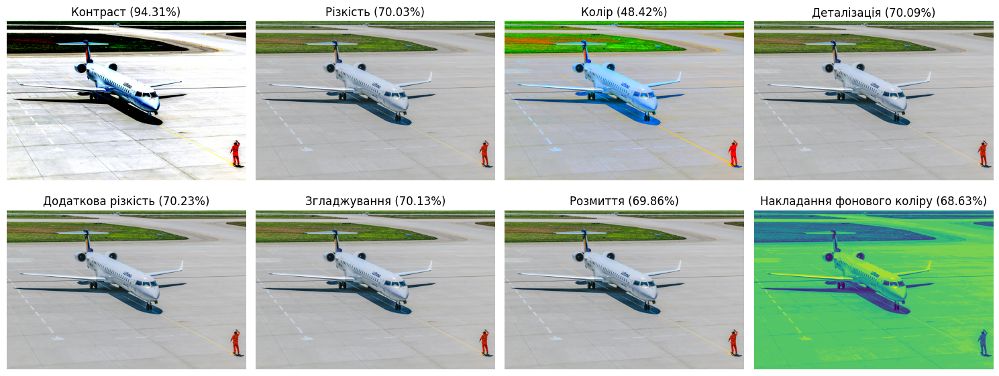

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Фільтр 'Контраст' допоміг: літак із вірогідністю 94.31%


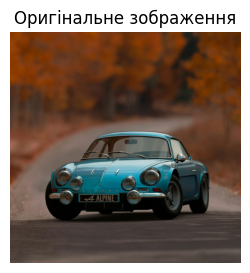

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
На картинці зображено автомобіль із вірогідністю у 96.56%


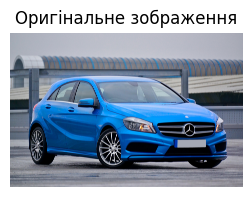

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
На картинці зображено автомобіль із вірогідністю у 91.13%


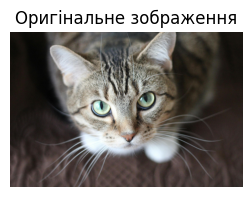

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
На картинці зображено кішка із вірогідністю у 96.28%


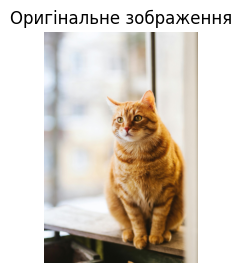

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Низька впевненість (45.79%). Застосування альтернативних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


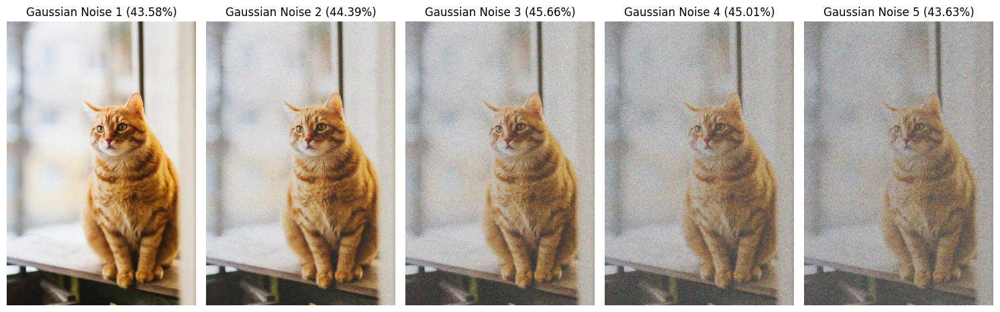

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Зображення не підходить для класифікації навіть після детальної обробки.


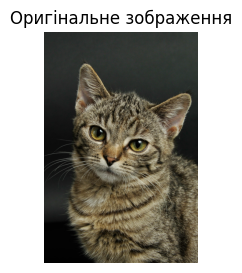

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
На картинці зображено жаба із вірогідністю у 89.31%


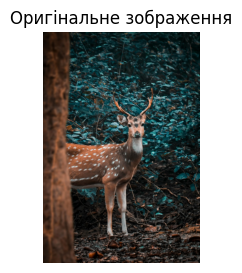

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Впевненість середня (61.14%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


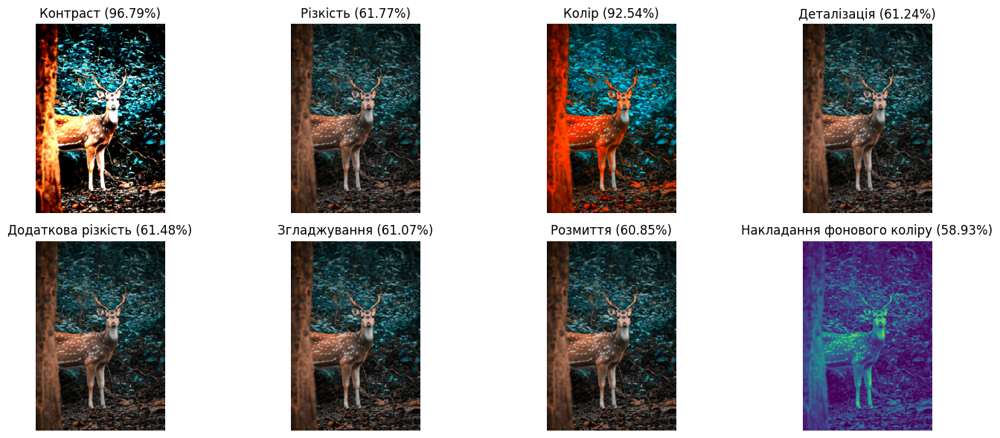

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Фільтр 'Контраст' допоміг: автомобіль із вірогідністю 96.79%


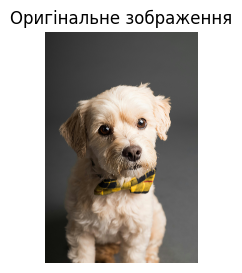

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
На картинці зображено собака із вірогідністю у 85.63%


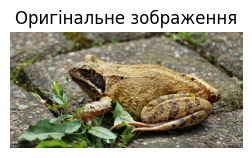

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
На картинці зображено жаба із вірогідністю у 96.48%


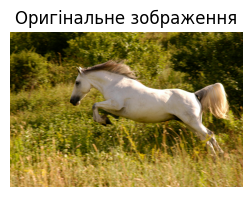

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Впевненість середня (57.09%). Застосування стандартних фільтрів...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


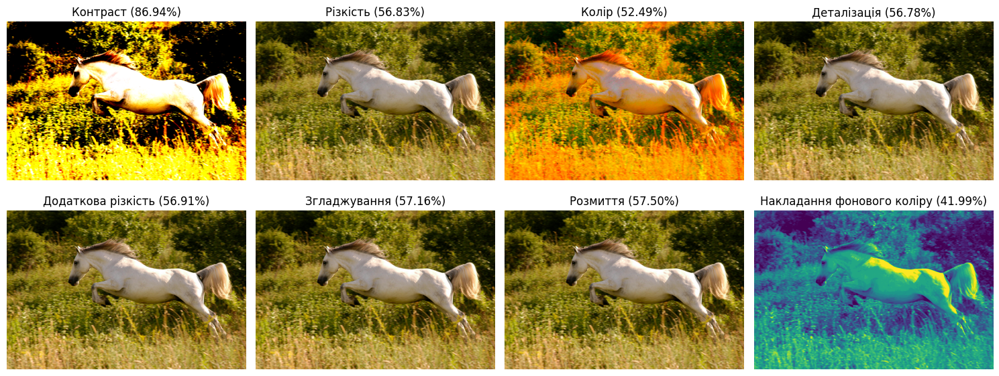

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Фільтр 'Контраст' допоміг: автомобіль із вірогідністю 86.94%


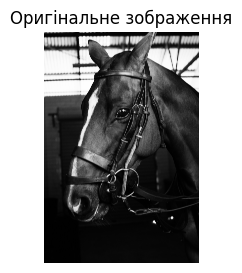

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Низька впевненість (44.17%). Застосування альтернативних фільтрів...


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
from google.colab import files
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# завантаження збереженої та натренованої ШНМ
model = load_model('/content/drive/MyDrive/cnn_model1_r1.keras')

# функція попередньої обробки зображення
def preprocess_image(img):
    # конвертація до RGB, якщо потрібно (при чорно-білому форматі)
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize((32, 32))  # Зміна розміру до 32x32
    img_array = img_to_array(img)
    img_array = img_array / 255.0
    img_array = np.expand_dims(img_array, axis=0)  #вимір для партії
    return img_array

# функція для додавання Gaussian noise
def add_gaussian_noise(img, mean=0, std=0.1):
    img_array = np.array(img) / 255.0  # нормалізація зображення
    noise = np.random.normal(mean, std, img_array.shape)  # генерація Gaussian noise
    noisy_img_array = np.clip(img_array + noise, 0, 1)  # додавання шуму та обмеження значень
    noisy_img = Image.fromarray((noisy_img_array * 255).astype(np.uint8))  # перетворення назад в зображення
    return noisy_img

# пороги впевненості у прогнозах моделі
confidence_threshold_high = 0.8
confidence_threshold_low = 0.5

# завантаження зображень від користувача через Colab
uploaded = files.upload()

# перебір зображень
for filename in uploaded.keys():
    img = Image.open(filename)

    # виведення оригінального зображення
    plt.figure(figsize=(3, 3))
    plt.imshow(img)
    plt.title("Оригінальне зображення")
    plt.axis('off')
    plt.show()

    # попередня обробка зображення
    img_processed = preprocess_image(img)
    prediction = model.predict(img_processed)

    # отримання прогнозованого класу та впевненості
    predicted_class = np.argmax(prediction)
    confidence = prediction[0][predicted_class]

    # назви класів
    class_labels = ['літак', 'автомобіль', 'птах', 'кішка', 'олень', 'собака', 'жаба', 'кінь', 'корабель', 'вантажівка']

    # перевірка на поріг впевненості (точності)
    if confidence >= confidence_threshold_high:
        print(f'На картинці зображено {class_labels[predicted_class]} із вірогідністю у {confidence * 100:.2f}%')
    elif confidence_threshold_low <= confidence < confidence_threshold_high:
        print(f"Впевненість середня ({confidence * 100:.2f}%). Застосування стандартних фільтрів...")

        # застосування стандартних фільтрів
        filters = [
            ("Контраст", ImageEnhance.Contrast(img).enhance(4)),
            ("Різкість", ImageEnhance.Sharpness(img).enhance(4)),
            ("Колір", ImageEnhance.Color(img).enhance(4)),
            ("Деталізація", img.filter(ImageFilter.DETAIL)),
            ("Додаткова різкість", img.filter(ImageFilter.SHARPEN)),
            ("Згладжування", img.filter(ImageFilter.SMOOTH)),
            ("Розмиття", img.filter(ImageFilter.GaussianBlur(1))),
            ("Накладання фонового коліру", img.convert('L').point(lambda x: x//16*16))
        ]

        # виведення результатів роботи стандартних фільтрів
        fig, axes = plt.subplots(2, 4, figsize=(15, 6))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного фільтра
        for filter_name, filtered_img in filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після застосування фільтрів.")

    else:
        print(f"Низька впевненість ({confidence * 100:.2f}%). Застосування альтернативних фільтрів...")

        # застосування альтернативних фільтрів (Gaussian noise)
        alternative_filters = [
            ("Gaussian Noise 1", add_gaussian_noise(img, std=0.1)),
            ("Gaussian Noise 2", add_gaussian_noise(img, std=0.3)),
            ("Gaussian Noise 3", add_gaussian_noise(img, std=0.5)),
            ("Gaussian Noise 4", add_gaussian_noise(img, std=0.7)),
            ("Gaussian Noise 5", add_gaussian_noise(img, std=0.9))
        ]

        # виведення результатів роботи альтернативних фільтрів
        fig, axes = plt.subplots(1, 5, figsize=(15, 5))
        axes = axes.flatten()
        for i, (filter_name, filtered_img) in enumerate(alternative_filters):
            # Обробка та виведення прогнозу для кожного фільтра
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            confidence = prediction[0][np.argmax(prediction)]

            axes[i].imshow(filtered_img)
            axes[i].set_title(f"{filter_name} ({confidence * 100:.2f}%)")
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()

        # повторна перевірка для кожного альтернативного фільтра
        for filter_name, filtered_img in alternative_filters:
            img_processed = preprocess_image(filtered_img)
            prediction = model.predict(img_processed)
            predicted_class = np.argmax(prediction)
            confidence = prediction[0][predicted_class]

            if confidence >= confidence_threshold_high:
                print(f"Фільтр '{filter_name}' допоміг: {class_labels[predicted_class]} із вірогідністю {confidence * 100:.2f}%")
                break
        else:
            print("Зображення не підходить для класифікації навіть після детальної обробки.")

